# Highway ramp exploration
  
### Purpose & Motivation
- Gather on-ramp and off-ramp station statistics. Explore ramp wiggle relationship.

### Direction from Advisor
- get ramp station statistics
 

### Tasks/Questions to Answer
#### Questions to Answer
- is there a relationship between ramp flow wiggles and adjacent station flow wiggles.

#### Tasks
- data for on-ramp/off-ramp
- with application to jam identification (delete?)
- with application to wiggles (use Miki's library functions)

- Grouped by station,times

- Plot ML stations near Offramp or Onramp (Josh's idea) to see how it looks.

- Ensure that you calculate for each OR/FR the mean flow vector for WEEKDAYS only.  After doing this aggregation, the wiggle analysis can be conducted.  



In [99]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import time
from os import listdir
from os.path import isfile, join
from datetime import time

import datetime as dt

import glob


import sys
sys.path.append('../')
import trafficpassion.AnalyzeWiggles as aw

In [100]:
#data locations
data_5min_path = "../data/station_5min/2015/d11/"
meta_path = "../data/station_5min/2015/meta_data/d11/"

# Get data file names

In [101]:
#get all files to process
onlyfiles = [f for f in listdir(data_5min_path) if isfile(join(data_5min_path, f))]

In [102]:
onlyfiles[0:3]

['d11_text_station_5min_2015_01_01.txt.gz',
 'd11_text_station_5min_2015_01_02.txt.gz',
 'd11_text_station_5min_2015_01_03.txt.gz']

In [103]:
colnames = [
    'Timestamp','Station','District','Freeway','Direction_of_Travel',
    'LaneType','StationLength','Samples',
    'Perc_Observed','TotalFlow','AvgOccupancy','AvgSpeed',
    'Lane1_Samples','Lane1_Flow','Lane1_AvgOcc','Lane1_AvgSpeed','Lane1_Observed',
    'Lane2_Samples','Lane2_Flow','Lane2_AvgOcc','Lane2_AvgSpeed','Lane2_Observed',
    'Lane3_Samples','Lane3_Flow','Lane3_AvgOcc','Lane3_AvgSpeed','Lane3_Observed',
    'Lane4_Samples','Lane4_Flow','Lane4_AvgOcc','Lane4_AvgSpeed','Lane4_Observed',
    'Lane5_Samples','Lane5_Flow','Lane5_AvgOcc','Lane5_AvgSpeed','Lane5_Observed',
    'Lane6_Samples','Lane6_Flow','Lane6_AvgOcc','Lane6_AvgSpeed','Lane6_Observed',
    'Lane7_Samples','Lane7_Flow','Lane7_AvgOcc','Lane7_AvgSpeed','Lane7_Observed',
    'Lane8_Samples','Lane8_Flow','Lane8_AvgOcc','Lane8_AvgSpeed','Lane8_Observed'
]
colnames = [c.lower() for c in colnames]

In [104]:
len(colnames)

52

In [105]:
from pyspark.sql import SQLContext
from pyspark.sql.types import *

# Make spark schema

struct list was generated with the following code after reading the files with inferschema = true, then hand modified 
```
'[' + ','.join(['StructField("%s",%s(),True)'% (colnames[idx], str(i.dataType))
for idx, i in enumerate(rdd.schema)]) + ']'
```

In [106]:
#print '[\n    ' + ",\n    ".join(['StructField("%s",%s(),True)'% (colnames[idx], str(i.dataType))
#for idx, i in enumerate(rdd.schema)]) + '\n]'

# Build dataframe with spark

In [107]:
struct_list = [
    StructField("timestamp",TimestampType(),True),
    StructField("station",IntegerType(),True),
    StructField("district",IntegerType(),True),
    StructField("freeway",IntegerType(),True),
    StructField("direction_of_travel",StringType(),True),
    StructField("lanetype",StringType(),True),
    StructField("stationlength",DoubleType(),True),
    StructField("samples",IntegerType(),True),
    StructField("perc_observed",IntegerType(),True),
    StructField("totalflow",IntegerType(),True),
    StructField("avgoccupancy",DoubleType(),True),
    StructField("avgspeed",DoubleType(),True),
    StructField("lane1_samples",IntegerType(),True),
    StructField("lane1_flow",IntegerType(),True),
    StructField("lane1_avgocc",DoubleType(),True),
    StructField("lane1_avgspeed",DoubleType(),True),
    StructField("lane1_observed",IntegerType(),True),
    StructField("lane2_samples",IntegerType(),True),
    StructField("lane2_flow",IntegerType(),True),
    StructField("lane2_avgocc",DoubleType(),True),
    StructField("lane2_avgspeed",DoubleType(),True),
    StructField("lane2_observed",IntegerType(),True),
    StructField("lane3_samples",IntegerType(),True),
    StructField("lane3_flow",IntegerType(),True),
    StructField("lane3_avgocc",DoubleType(),True),
    StructField("lane3_avgspeed",DoubleType(),True),
    StructField("lane3_observed",IntegerType(),True),
    StructField("lane4_samples",IntegerType(),True),
    StructField("lane4_flow",IntegerType(),True),
    StructField("lane4_avgocc",DoubleType(),True),
    StructField("lane4_avgspeed",DoubleType(),True),
    StructField("lane4_observed",IntegerType(),True),
    StructField("lane5_samples",IntegerType(),True),
    StructField("lane5_flow",IntegerType(),True),
    StructField("lane5_avgocc",DoubleType(),True),
    StructField("lane5_avgspeed",DoubleType(),True),
    StructField("lane5_observed",IntegerType(),True),
    StructField("lane6_samples",IntegerType(),True),
    StructField("lane6_flow",IntegerType(),True),
    StructField("lane6_avgocc",DoubleType(),True),
    StructField("lane6_avgspeed",DoubleType(),True),
    StructField("lane6_observed",IntegerType(),True),
    StructField("lane7_samples",IntegerType(),True),
    StructField("lane7_flow",IntegerType(),True),
    StructField("lane7_avgocc",DoubleType(),True),
    StructField("lane7_avgspeed",DoubleType(),True),
    StructField("lane7_observed",IntegerType(),True),
    StructField("lane8_samples",IntegerType(),True),
    StructField("lane8_flow",IntegerType(),True),
    StructField("lane8_avgocc",DoubleType(),True),
    StructField("lane8_avgspeed",DoubleType(),True),
    StructField("lane8_observed",IntegerType(),True)
]

schema_struct = StructType(struct_list)

In [108]:
#node this is only the first 5 days of files for now
files = [data_5min_path + filename for filename in onlyfiles]#[:5]]

rdd = spark.read.csv(
    files, 
    header='false',
    timestampFormat='MM/dd/yyyy HH:mm:ss',
    schema=schema_struct,
    inferSchema='false'
)
    
rdd.take(1)

[Row(timestamp=datetime.datetime(2015, 2, 20, 0, 0), station=1100313, district=11, freeway=5, direction_of_travel=u'N', lanetype=u'FR', stationlength=None, samples=10, perc_observed=100, totalflow=12, avgoccupancy=None, avgspeed=None, lane1_samples=10, lane1_flow=12, lane1_avgocc=None, lane1_avgspeed=None, lane1_observed=1, lane2_samples=None, lane2_flow=None, lane2_avgocc=None, lane2_avgspeed=None, lane2_observed=0, lane3_samples=None, lane3_flow=None, lane3_avgocc=None, lane3_avgspeed=None, lane3_observed=0, lane4_samples=None, lane4_flow=None, lane4_avgocc=None, lane4_avgspeed=None, lane4_observed=0, lane5_samples=None, lane5_flow=None, lane5_avgocc=None, lane5_avgspeed=None, lane5_observed=0, lane6_samples=None, lane6_flow=None, lane6_avgocc=None, lane6_avgspeed=None, lane6_observed=0, lane7_samples=None, lane7_flow=None, lane7_avgocc=None, lane7_avgspeed=None, lane7_observed=0, lane8_samples=None, lane8_flow=None, lane8_avgocc=None, lane8_avgspeed=None, lane8_observed=0)]

In [109]:
rdd.count()

154289957

# now lets group by station, time

In [110]:
from pyspark.sql.functions import hour, mean,minute, stddev, count,max as psmax,min as psmin

In [111]:
station_time = (
    rdd.groupBy([
        'station',
        hour("timestamp").alias("hour"),
        minute("timestamp").alias("minute")
    ]).agg(
        mean("totalflow").alias("flow_mean"),
        stddev("totalflow").alias("flow_std"),
        count("totalflow").alias("flow_count"),
        psmax("totalflow").alias("flow_max"),
        psmin("totalflow").alias("flow_min")
    )
)
#station_time.show(10)

In [112]:
df = station_time.toPandas()

In [113]:
df.station.unique().shape

(1541,)

In [114]:
df['flow_std_plus_mean'] = df.flow_mean + df.flow_std
df['flow_std_minus_mean'] = df.flow_mean - df.flow_std

In [115]:
df['time'] = df.apply(lambda x:time(int(x.hour),int(x.minute)),axis = 1)

In [116]:
df.sort_values('time',inplace=True)

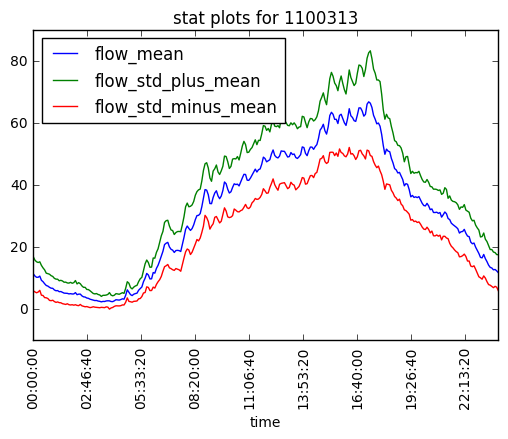

In [117]:
for g,g_df in  df.groupby('station'):
    g_df.plot(
        x='time', 
        y=['flow_mean','flow_std_plus_mean','flow_std_minus_mean'],
        title='stat plots for %i'%g,
        rot=90
    )
    plt.show()
    break

In [118]:

from scipy.interpolate import interp1d, Akima1DInterpolator
from sklearn import preprocessing
def interpolate(meanVector, kind, factor):
    y = meanVector
    y_len = len(y)
    x = np.arange(0,y_len)
    
    interpolator = {
        'akima': Akima1DInterpolator(x, y),
        'cubic': interp1d(x, y, kind='cubic'),
        'linear': interp1d(x, y, kind='linear')
    }
    
    interpolate = interpolator[kind]

    mid_factor = factor/2
    
    interp = [interpolate(np.arange(i,y_len, factor)) for i in range(factor)]
    myArray = reduce(lambda x,y:x+y,interp)

    my_x = np.arange(mid_factor,y_len, factor)
    
    extrapolator = {
        'akima': Akima1DInterpolator(my_x, myArray/factor),
        'cubic': interp1d(my_x, myArray/factor, kind='cubic'),
        'linear': interp1d(my_x, myArray/factor, kind='linear')
    }
    
    extrapolate = extrapolator[kind]
    
    new_x = np.arange(mid_factor,y_len-mid_factor)
    interpolated = extrapolate( np.arange(mid_factor,y_len-mid_factor))

    #wut??
    #pad front and back with mean vector 
    xprime = np.append(np.arange(0,mid_factor), new_x)
    xprime = np.append(xprime, np.arange(max(xprime)+1,y_len))
    yprime = np.append(y[:mid_factor], interpolated)
    yprime = np.append(yprime, y[-mid_factor:])

    return yprime


def smooth_vector(meanVector, kind='akima', factor=6):
    smoothedVector = interpolate(meanVector, kind, factor )
    diff = meanVector - smoothedVector
    diffVector = diff/np.linalg.norm(diff) 
    
    return {  
        'smoothedVector': smoothedVector, 
        'diffVector': diffVector
    }

vectors = smooth_vector(g_df['flow_mean'].values, 'akima', 12)

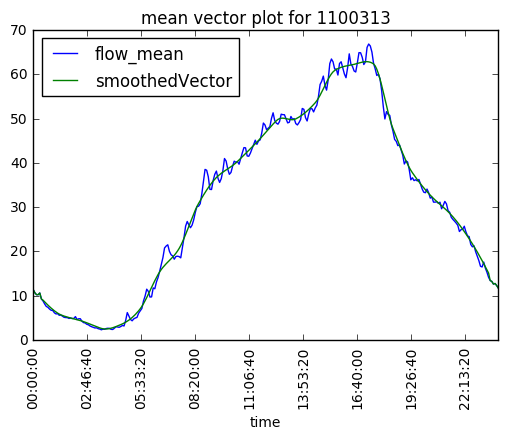

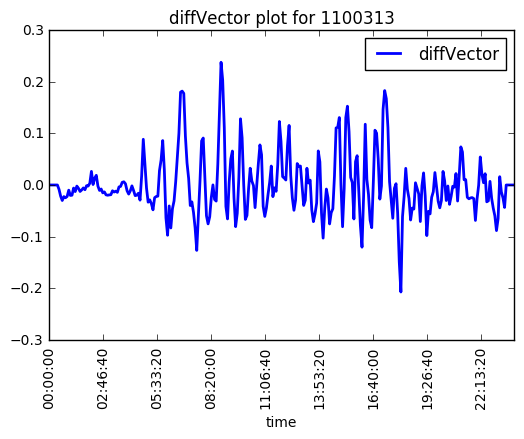

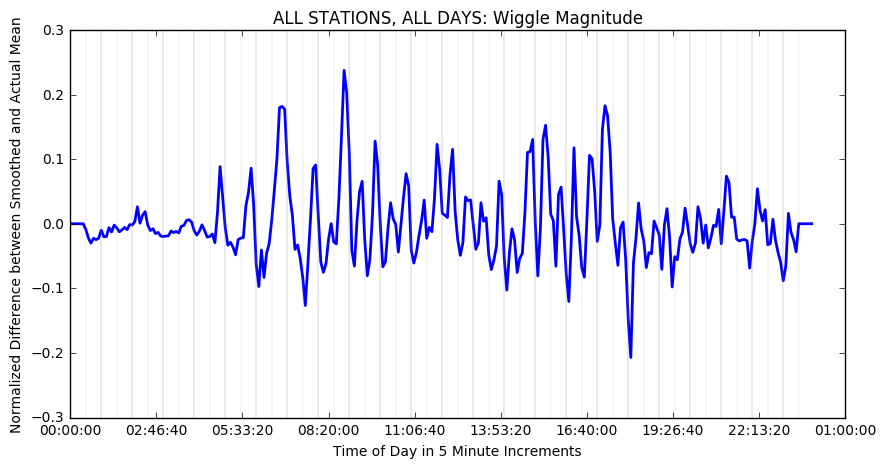

In [119]:
vectors = smooth_vector(g_df['flow_mean'].values, 'akima', 12)
g_df['smoothedVector'] = vectors['smoothedVector']
g_df['diffVector'] = vectors['diffVector']

g_df.plot(
    x='time',
    y=['flow_mean','smoothedVector'], 
    rot=90,
    title='mean vector plot for %i'%(g)
)

g_df.plot(
    x='time',
    y='diffVector',
    rot=90,
    linewidth=2,
    title='diffVector plot for %i'%(g)
)

plt.figure(figsize = (10,5))
plt.plot(g_df['time'],g_df['diffVector'], color="blue", linewidth=2)
plt.title("ALL STATIONS, ALL DAYS: Wiggle Magnitude")
for i in range(0,288,12):
    plt.axvline(x=g_df['time'].iloc[i], linewidth=.25, color='gray')
    plt.axvline(x=g_df['time'].iloc[i+6], linewidth=.1, color='gray')

plt.xlabel('Time of Day in 5 Minute Increments')
plt.ylabel('Normalized Difference between Smoothed and Actual Mean')
plt.show()

# Get metadata and identify all FR OR and their preceding and antceding station

In [120]:
def loadMeta():
    meta_dir='../data/External/meta/2015/d11/d11_text_meta_2015_*.txt'
    meta_files = glob.glob(meta_dir)

    meta_file_list = []
    for meta_file in meta_files:
        date = str('_'.join(meta_file.split('_')[4:7])).split('.')[0]
        df = pd.read_table(meta_file, index_col=None, header=0)
        date_col = pd.Series([date] * len(df))
        df['file_date'] = date_col
        # drop rows that are missing latitude / longitude values
        #df.dropna(inplace=True, subset=['Latitude', 'Longitude'], how='any')
        meta_file_list.append(df)

    meta_frame = pd.concat(meta_file_list).drop_duplicates(subset='ID', keep='last')

    usefwy = [ 56, 125, 805,  52, 163,   8,  15,   5, 905,  78,  94,  54]

    meta_frame = meta_frame[meta_frame.Fwy.apply(lambda x: x in usefwy)]

    #Add freeway name FwyDir
    meta_frame['freeway'] = meta_frame.Fwy.apply(str) + meta_frame.Dir
    
    r_c = {}
    for c in meta_frame.columns:
        r_c[c]=c.lower()
    
    meta_frame=meta_frame.rename(columns = r_c )
    return meta_frame

loadMeta().head(1)

,id,fwy,dir,district,county,city,state_pm,abs_pm,latitude,longitude,length,type,lanes,name,user_id_1,user_id_2,user_id_3,user_id_4,file_date,freeway
584,1113072,56,W,11,73,66000.0,7.383,7.885,32.955202,-117.124689,0.452,ML,2,Black Mountain Rd,314,NaN,NaN,NaN,01_01,56W


In [121]:
loadMeta().head(1)

,id,fwy,dir,district,county,city,state_pm,abs_pm,latitude,longitude,length,type,lanes,name,user_id_1,user_id_2,user_id_3,user_id_4,file_date,freeway
584,1113072,56,W,11,73,66000.0,7.383,7.885,32.955202,-117.124689,0.452,ML,2,Black Mountain Rd,314,NaN,NaN,NaN,01_01,56W


In [122]:
#loadMeta.type.apply(lambda x: x in [])

In [123]:
len(r_df)

49

/Users/multidest/Applications/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/multidest/Applications/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/multidest/Applications/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/index

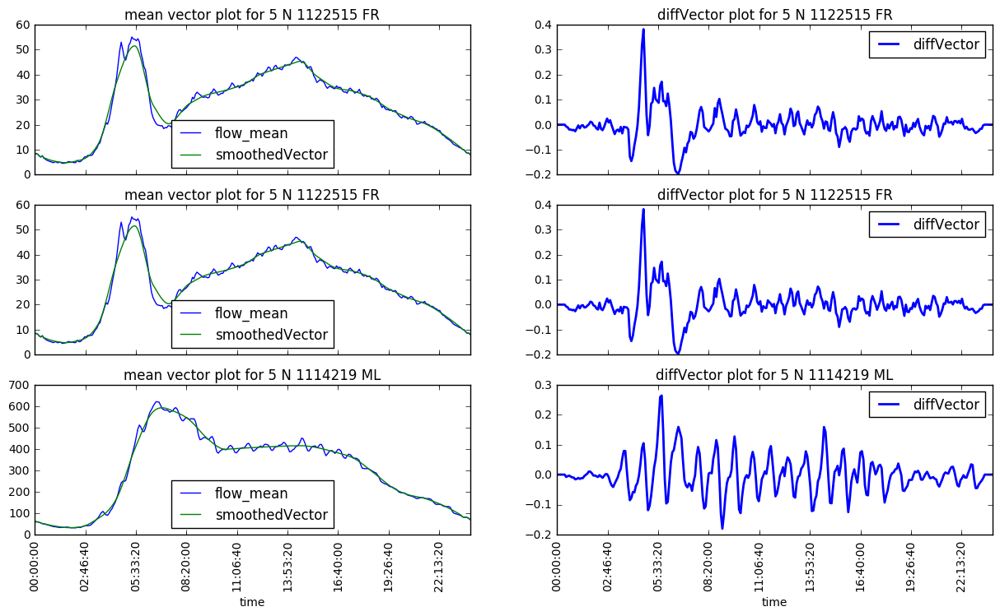

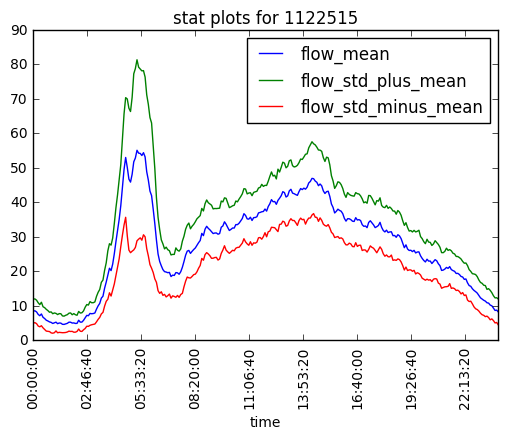

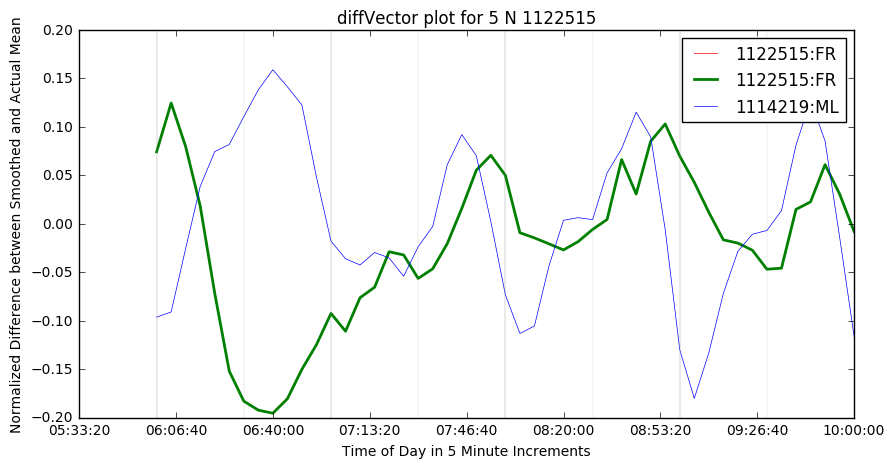

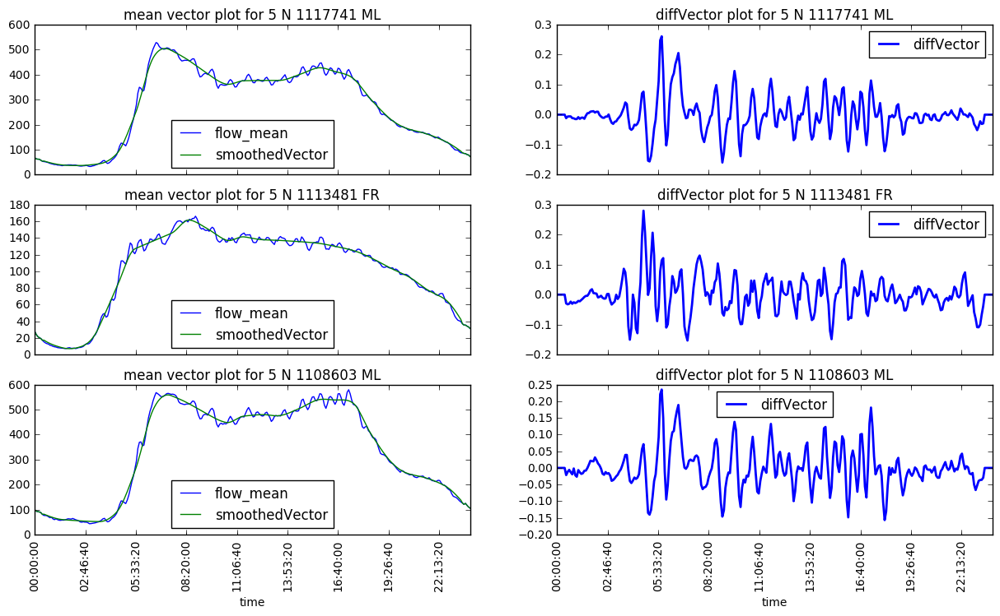

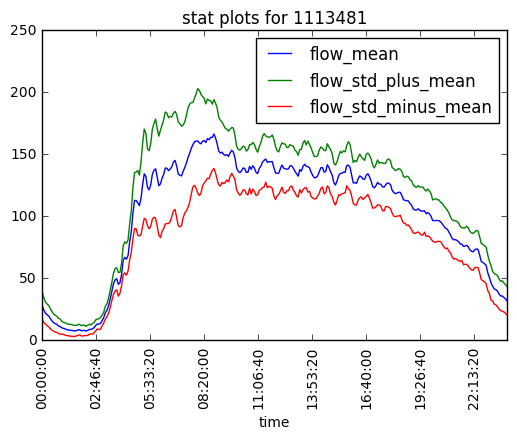

...

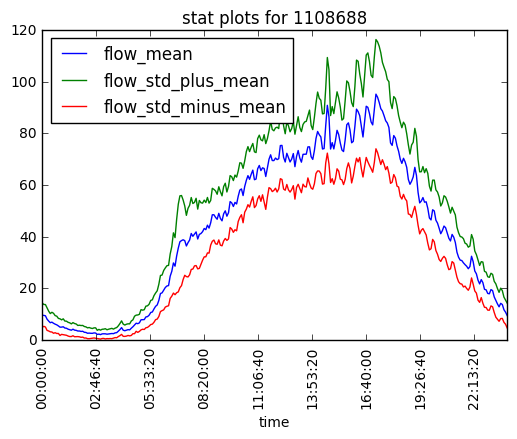

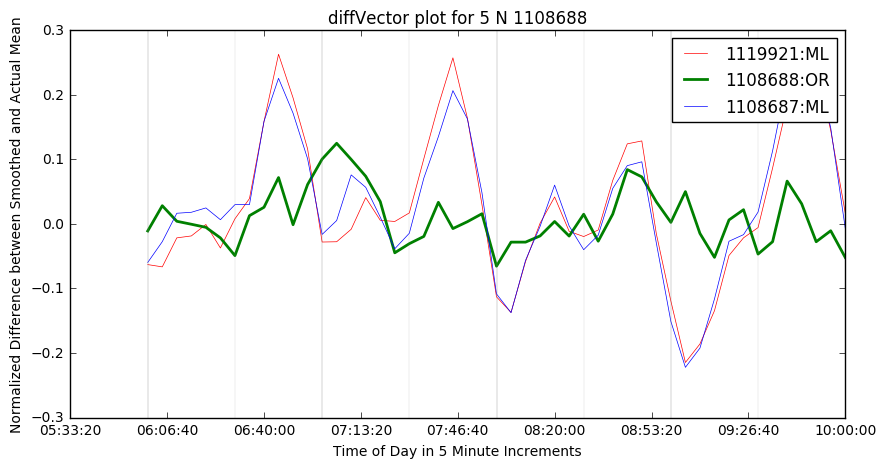

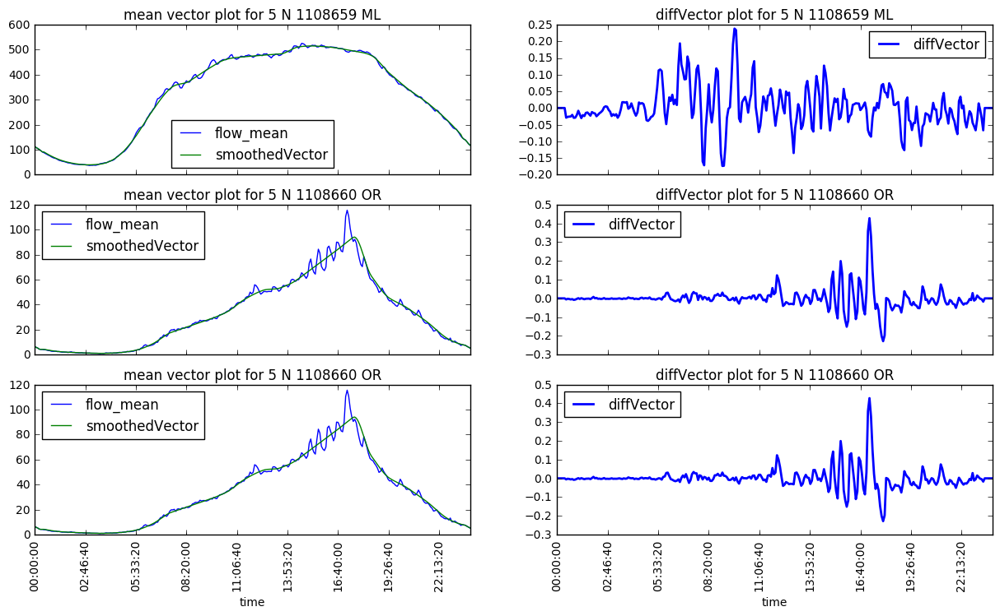

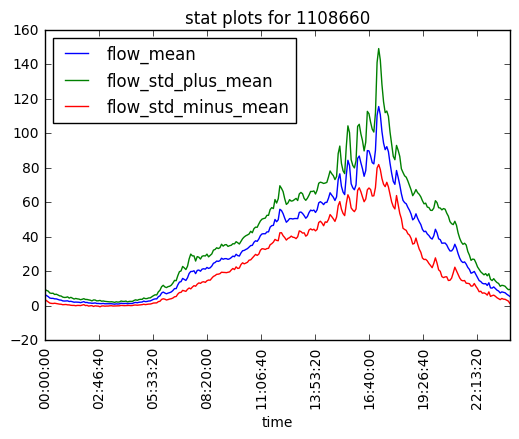

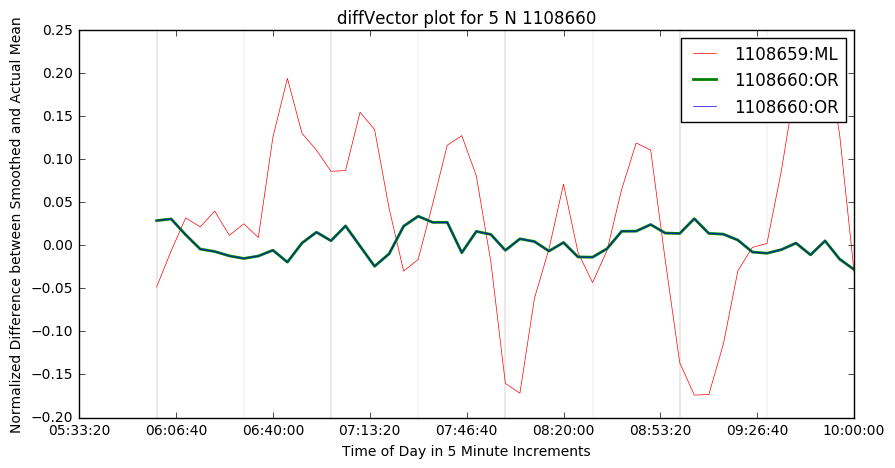

In [126]:
station_type_dict = loadMeta().loc[:,['id','type']].set_index('id').to_dict()['type']

station_df = df.groupby('station')

for fwy, fwy_df in loadMeta().groupby('fwy'):
    for d, d_df in fwy_df.groupby('dir'):
        
        ramps_i = []
        ramps_j = []
        ramps = []
        
        for r in ['FR','OR']:
            rr_df = d_df[d_df.type.apply(lambda x: x in [r,'ML'])]
            rr_df.sort_values('abs_pm', inplace=True)
            rr_df.reset_index(drop=True, inplace=True)

            ramps_index = rr_df[rr_df.type.apply(lambda x: x == r)].index.tolist()

            b_i = [max(i-1, min(ramps_index)) for i in ramps_index]
            b_j = [min(i+1, max(ramps_index)) for i in ramps_index]

            ramps_i += list(rr_df.iloc[b_i,:].id)
            ramps_j += list(rr_df.iloc[b_j,:].id)
            ramps += list(rr_df.iloc[ramps_index,:].id)

       
        for p in zip(ramps_i,ramps,ramps_j):
            fig, axs = plt.subplots(figsize=[15,8], ncols=2, nrows=3, sharex=True)
                        
            for idx, r in enumerate(p):                
                r_df = station_df.get_group(r)
                vectors = smooth_vector(r_df['flow_mean'].values, 'akima', 12)
                r_df['smoothedVector'] = vectors['smoothedVector']
                r_df['diffVector'] = vectors['diffVector']
                
                r_df.plot(
                    x='time',
                    y=['flow_mean','smoothedVector'], 
                    rot=90,
                    title='mean vector plot for %s %s %i %s'%(fwy,d,r,station_type_dict[r]),
                    ax=axs[idx][0]
                )

                r_df.plot(
                    x='time',
                    y='diffVector',
                    rot=90,
                    linewidth=2,
                    title='diffVector plot for %s %s %i %s'%(fwy,d,r,station_type_dict[r]),
                    ax=axs[idx][1]
                )
                
            station_df.get_group(p[1]).plot(
                x='time', 
                y=['flow_mean','flow_std_plus_mean','flow_std_minus_mean'],
                title='stat plots for %i'%p[1],
                rot=90
            )

            plt.figure(figsize = (10,5))
            
            colors = ['red','green','blue']
            widths = [0.5,2,0.5]
            hddl=[]
            
            for idx, r in enumerate(p):                
                r_df = station_df.get_group(r)
                vectors = smooth_vector(r_df['flow_mean'].values, 'akima', 12)
                r_df['smoothedVector'] = vectors['smoothedVector']
                r_df['diffVector'] = vectors['diffVector']
                
                r_df= r_df.set_index('time').sort_index().loc[dt.time(6, 0):dt.time(10, 0),:].reset_index()
                
                hddl +=plt.plot(r_df['time'], r_df['diffVector'], color=colors[idx], linewidth=widths[idx], label='%i:%s'%(r,station_type_dict[r]))
                
            plt.legend(handles=hddl)
                
            plt.title('diffVector plot for %s %s %i'%(fwy,d,p[1]))
            
            for i in range(0, len(r_df)-1, 12):
                plt.axvline(x=r_df['time'].iloc[i], linewidth=0.25, color='gray')
                plt.axvline(x=r_df['time'].iloc[i+6], linewidth=0.1, color='gray')

            plt.xlabel('Time of Day in 5 Minute Increments')
            plt.ylabel('Normalized Difference between Smoothed and Actual Mean')
            plt.show()
            

        break
    break
        